In [1]:
!pip install omegaconf
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144575 sha256=bc6f9a87bad6ba7418899705e4c110832d7760c5f44edc37630c7ff2d64fc262
  Stored in directory: /root/.cache/pip/wheels/8b/8d/53/2af8772d9aec614e3fc65e53d4a993ad73c61daa8bbd85a873
Successfully built antlr4-python3-runtime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wget

In [2]:
!mkdir /kaggle/tmp
%cd /kaggle/tmp

/kaggle/tmp


In [3]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("roboflow_api")

## Dataset import

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key=secret_value_0)
project = rf.workspace("roboflow-jvuqo").project("football-players-detection-3zvbc")
dataset = project.version(4).download("voc")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to football-players-detection-4 in voc:: 100%|██████████| 515/515 [00:00<00:00, 1117.59it/s]


In [10]:
# !mkdir football-players-detection-4/
# !mkdir football-players-detection-4/train
# !cp ../input/football-players-detection/* football-players-detection-4/train/

In [12]:
import xml.etree.ElementTree as ET

# parse xml file
tree = ET.parse("football-players-detection-4/train/08fd33_0_1_png.rf.59954a0e7db57cb7481c52f01f7195e5.xml") 
root = tree.getroot() # get root object

In [13]:
height = int(root.find("size")[0].text)
width = int(root.find("size")[1].text)
channels = int(root.find("size")[2].text)

print('Image shpae : ',width,height,channels)

Image shpae :  1080 1920 3


In [14]:
bbox_coordinates = []
for member in root.findall('object'):
    class_name = member[0].text # class name        
    # bbox coordinates
    xmin = int(member[5][0].text)
    ymin = int(member[5][1].text)
    xmax = int(member[5][2].text)
    ymax = int(member[5][3].text)
    # store data in list
    bbox_coordinates.append([class_name, xmin, ymin, xmax, ymax])

print(bbox_coordinates)

[['referee', 630, 642, 325, 352], ['player', 839, 861, 368, 404], ['referee', 941, 957, 408, 444], ['player', 1201, 1218, 449, 488], ['goalkeeper', 1739, 1762, 436, 478], ['player', 1207, 1224, 544, 589], ['player', 1243, 1262, 452, 494], ['player', 1210, 1229, 403, 434], ['player', 978, 995, 428, 465], ['player', 1270, 1287, 420, 456], ['player', 1167, 1183, 432, 469], ['player', 1026, 1040, 402, 437], ['player', 945, 969, 476, 518], ['player', 1307, 1332, 648, 705], ['player', 1612, 1636, 680, 734], ['player', 1186, 1202, 489, 530], ['player', 828, 850, 659, 716], ['player', 785, 810, 566, 609], ['player', 1356, 1380, 504, 552], ['goalkeeper', 288, 304, 502, 546], ['player', 481, 498, 451, 489], ['referee', 1587, 1615, 701, 761], ['player', 1487, 1509, 620, 662], ['player', 830, 851, 521, 570], ['player', 1205, 1223, 378, 416], ['ball', 653, 667, 656, 670]]


In [15]:
!mkdir football-players-detection-4/annotations

In [16]:
!mv football-players-detection-4/train/*.xml football-players-detection-4/annotations/

In [17]:
#==================
# Import libraries
#==================
import os
import gc
import cv2
import glob
import time
import copy
import random

import numpy as np 
import pandas as pd 

from PIL import Image
from glob import glob
import xml.etree.ElementTree as ET 

from omegaconf import OmegaConf
from pathlib import Path 
from typing import Union, Tuple, List, Iterable, Dict 
from collections import defaultdict

import logging 
from logging import  getLogger, StreamHandler, Formatter

import torch
import torchvision
from torchvision import transforms
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import TensorDataset
from torch.optim import lr_scheduler 
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use(['default']) 

from datetime import datetime
today = str(datetime.today()).split(" ")[0].replace("-", "")
print(today)

20230325


In [26]:
#==================
# Config
#==================
dict_conf = {
    # path
    'bdd_xml': "./football-players-detection-4/annotations",
    'bdd_img': "./football-players-detection-4/train",
    'test_path': "/kaggle/input/dfl-annotation-dataset-for-mandetection/Test",
    'log_path': "./",
    # class of dataset
    'dataset_class' : ['ball','goalkeeper','player','referee'],
    # colors (RGB)
    'colors' : ((0,0,0),(222,49,99),(100,149,237),(255,191,0),(136,78,160)),  
    # hyper prams of Faster-RCNN
    'epochs' : 5,
    'batch_size' : 6,
    'lr' : 0.005,
    'wd' : 1e-6,
    'scheduler' : 'CosineAnnealingLR', # 'CosineAnnealingLR' 'ReduceLROnPlateau'
    'min_lr' : 1e-6,
    'T_max' : 2400, 
    'T_0' : 25,
    'scale' : 1080, # 720 # image_scale (Vertical)
    # hyper prams of Faster-RCNN inference
    'threshold' : 0.8,
    # seed
    'seed' : 2022
}
# GPU(cuda)/CPU
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu') 
print('device :  ',device)
cfg = OmegaConf.create(dict_conf)

device :   cuda


In [27]:
#==================
# Seed
#==================
def set_seed(seed = 42):
    '''Sets the seed of the entire notebook so results are the same every time we run.
    This is for REPRODUCIBILITY.'''
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    # Set a fixed value for the hash seed
    os.environ['PYTHONHASHSEED'] = str(seed)
    print('> SEEDING DONE')
    
set_seed(cfg.seed)

> SEEDING DONE


In [28]:
#==================
# Logger
#==================
logger = getLogger(__name__)
logger.setLevel(logging.DEBUG)
filehandler = logging.FileHandler(os.path.join(cfg.log_path, "Faster-RCNN.txt"))
streamhander = StreamHandler()
filehandler.setLevel(logging.DEBUG)
streamhander.setLevel(logging.DEBUG)
handler_format = Formatter('[%(asctime)s][%(name)s][%(levelname)s][%(message)s]')
filehandler.setFormatter(handler_format)
streamhander.setFormatter(handler_format)
logger.addHandler(filehandler)
logger.addHandler(streamhander)

for k, v in cfg.items():
    logger.info(f"key: {k}, value: {v}")
logger.info(device)

[2023-03-25 18:03:21,249][__main__][INFO][key: bdd_xml, value: ./football-players-detection-4/annotations]
[2023-03-25 18:03:21,249][__main__][INFO][key: bdd_xml, value: ./football-players-detection-4/annotations]
[2023-03-25 18:03:21,253][__main__][INFO][key: bdd_img, value: ./football-players-detection-4/train]
[2023-03-25 18:03:21,253][__main__][INFO][key: bdd_img, value: ./football-players-detection-4/train]
[2023-03-25 18:03:21,258][__main__][INFO][key: test_path, value: /kaggle/input/dfl-annotation-dataset-for-mandetection/Test]
[2023-03-25 18:03:21,258][__main__][INFO][key: test_path, value: /kaggle/input/dfl-annotation-dataset-for-mandetection/Test]
[2023-03-25 18:03:21,261][__main__][INFO][key: log_path, value: ./]
[2023-03-25 18:03:21,261][__main__][INFO][key: log_path, value: ./]
[2023-03-25 18:03:21,264][__main__][INFO][key: dataset_class, value: ['ball', 'goalkeeper', 'player', 'referee']]
[2023-03-25 18:03:21,264][__main__][INFO][key: dataset_class, value: ['ball', 'goalk

In [29]:
class xml2list(object):    
    def __init__(self, classes):
        self.classes = classes
        
    def __call__(self, xml_path):
        """xmlファイルからBBOX情報を読み取り、アノテーション情報とBBOX数を返す.
        Reads BBOX information from the xml file and returns annotation information and the number of BBOXes.

        Args:
            xml_path (Path): xmlファイルのpath

        Returns:
            anno(dict), num_objs(int): BBOXの各種情報、BBOX数
        """
        ret = []
        xml = ET.parse(xml_path).getroot()
        
        boxes = []
        labels = []
        num = 0
        
        for num, obj in enumerate(xml.iter('object')):            
            label = obj.find('name').text          
            # 対象のクラスのみBBOXを読み込む
            if label in self.classes :
                bndbox = obj.find('bndbox')
                xmin = int(float(bndbox.find('xmin').text))
                ymin = int(float(bndbox.find('ymin').text))
                xmax = int(float(bndbox.find('xmax').text))
                ymax = int(float(bndbox.find('ymax').text))
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(self.classes.index(label))
            else:
                continue
            
        anno = {'bboxes':boxes, 'labels':labels}
        num_objs = num + 1
        return anno, num_objs

In [30]:
class xml2list(object):    
    def __init__(self, classes):
        self.classes = classes
        
    def __call__(self, xml_path):
        """xmlファイルからBBOX情報を読み取り、アノテーション情報とBBOX数を返す.
        Reads BBOX information from the xml file and returns annotation information and the number of BBOXes.

        Args:
            xml_path (Path): xmlファイルのpath

        Returns:
            anno(dict), num_objs(int): BBOXの各種情報、BBOX数
        """
        ret = []
        xml = ET.parse(xml_path).getroot()
        
        boxes = []
        labels = []
        num = 0
        
        for num, obj in enumerate(xml.iter('object')):            
            label = obj.find('name').text          
            # 対象のクラスのみBBOXを読み込む
            if label in self.classes :
                bndbox = obj.find('bndbox')
                xmin = int(float(bndbox.find('xmin').text))
                ymin = int(float(bndbox.find('ymin').text))
                xmax = int(float(bndbox.find('xmax').text))
                ymax = int(float(bndbox.find('ymax').text))
                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(self.classes.index(label))
            else:
                continue
            
        anno = {'bboxes':boxes, 'labels':labels}
        num_objs = num + 1
        return anno, num_objs

In [31]:
class MyDataset(torch.utils.data.Dataset):    
        def __init__(self, xml_paths, image_dir, xml_dir, scale, classes):            
            super().__init__()
            self.image_dir = image_dir
            self.xml_dir   = xml_dir
            self.xml_paths = xml_paths
            self.scale = scale
            self.classes = classes
            
        def __getitem__(self, index):   
            # transformの定義 / Define transform
            transform = transforms.Compose(
                [transforms.ToTensor()] # ndarray -> Tensor
                )
            
            # 入力画像の読み込み / Load input images
            image_id = self.xml_paths[index].split("/")[-1].split(".xm")[0]   # .xml前の名前をファイル名として読み込む
            # image_id = self.image_ids[index].split("/")[-1].split(".xm")[0] # .xml前の名前をファイル名として読み込む
#             print('Image ID : ',image_id)
            image = Image.open(f"{self.image_dir}/{image_id}.jpg")
                        
            # 画像のスケール変換
            t_scale_tate = self.scale # 目標のスケール(縦)
            # 縮小比を計算 / Calculate shrinkage ratio
            ratio = t_scale_tate / image.size[1]
            # 目標横スケールを計算
            t_scale_yoko = image.size[0] * ratio
            t_scale_yoko = int(t_scale_yoko)
            
            # Resize
            image = image.resize((t_scale_yoko,t_scale_tate))  
            image = transform(image)

            # xml2listクラスtransform_annoを定義 
            transform_anno = xml2list(self.classes)
            # anotation情報と物体数を取得
            path_xml = f'{self.xml_dir}/{image_id}.xml'
            # path_xml = f'{self.xml_path}/{image_id}.xml'
            annotations, obje_num = transform_anno(path_xml)
            boxes = torch.as_tensor(annotations['bboxes'], dtype=torch.int64)
            labels = torch.as_tensor(annotations['labels'], dtype=torch.int64)

            # bboxの縮小 / bbox reduction
            boxes = boxes * ratio
            # Area
            area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
            area = torch.as_tensor(area, dtype=torch.float32)

            iscrowd = torch.zeros((obje_num,), dtype=torch.int64)

            # 辞書型にして、各種情報を入れる
            # Dictionary type to include various types of information
            target = {}
            target["boxes"] = boxes
            target["labels"] = labels+1
            target["image_id"] = torch.tensor([index])
            target["area"] = area
            target["iscrowd"] = iscrowd
            return image, target, image_id
        
        def __len__(self):
            return len(self.xml_paths)

## Model

In [32]:
def model ():
    # モデルの定義 / define FasterRCNNmodel
    num_classes = 0
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    num_classes = len(cfg.dataset_class) + 1
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

In [33]:
def fetch_scheduler(optimizer):
    if cfg.scheduler == 'CosineAnnealingLR':
        scheduler = lr_scheduler.CosineAnnealingLR(optimizer,T_max=cfg.T_max, 
                                                   eta_min=cfg.min_lr)
    elif cfg.scheduler == 'CosineAnnealingWarmRestarts':
        scheduler = lr_scheduler.CosineAnnealingWarmRestarts(optimizer,T_0=cfg.T_0, 
                                                             eta_min=cfg.min_lr)
    elif cfg.scheduler == 'ReduceLROnPlateau':
        scheduler = lr_scheduler.ReduceLROnPlateau(optimizer,
                                                   mode='min',
                                                   factor=0.1,
                                                   patience=5,
                                                   threshold=0.0001,
                                                   min_lr=cfg.min_lr,)
    elif cfg.scheduer == 'ExponentialLR':
        scheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.85)
    elif cfg.scheduler == None:
        return None
        
    return scheduler

## Training

In [34]:
# =====================
# Read xml path_list
# =====================
train_xml_path = sorted(glob('{}/*'.format(cfg.bdd_xml)))

In [35]:
# =====================
# Make DataLoader
# =====================
def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = MyDataset(train_xml_path, cfg.bdd_img, cfg.bdd_xml, cfg.scale, cfg.dataset_class)
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, 
    batch_size = cfg.batch_size, 
    shuffle = True,
    collate_fn = collate_fn
    )

In [36]:
# =====================
# Make Model
# =====================
model = model()
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr = cfg.lr, momentum = 0.9, weight_decay = cfg.wd)
scheduler = fetch_scheduler(optimizer)

model.to(device)
model.train() 

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [37]:
# def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq):
#     model.train()
#     metric_logger = utils.MetricLogger(delimiter="  ")
#     metric_logger.add_meter('lr', utils.SmoothedValue(window_size=1, fmt='{value:.6f}'))
#     header = 'Epoch: [{}]'.format(epoch)

          
#     lr_scheduler = None
#     if epoch == 0:
#         warmup_factor = 1. / 1000
#         warmup_iters = min(1000, len(data_loader) - 1)

          
#         lr_scheduler = utils.warmup_lr_scheduler(optimizer, warmup_iters, warmup_factor)

          
#     for images, targets in metric_logger.log_every(data_loader, print_freq, header):
#         images = list(image.to(device) for image in images)
#         targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

          
#         loss_dict = model(images, targets)

          
#         losses = sum(loss for loss in loss_dict.values())

In [38]:
def train_one_epoch(model, optimizer, scheduler, dataloader, device, epoch):
    """1epoch分の学習を実行する"""  
    model.train()
    loss_epo = []    
    
    for i, batch in enumerate(dataloader):
        images, targets, image_ids = batch # batchはそのミニバッジのimage、tagets,image_idsが入ってる
        
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        # 学習モードでは画像とターゲット（ground-truth）を入力する 
        # In training mode, enter image and target (ground-truth)
        # 返り値はdict[tensor]でlossが入ってる。（RPNとRCNN両方のloss）
        # Return value is dict[tensor] with loss. (loss for both RPN and RCNN)
        loss_dict = model(images, targets)
        # ex.){'loss_classifier': tensor(0.1742, device='cuda:0', grad_fn=<NllLossBackward0>),
        #      'loss_box_reg': tensor(0.3814, device='cuda:0', grad_fn=<DivBackward0>),
        #      'loss_objectness': tensor(0.0092, device='cuda:0', grad_fn=<BinaryCrossEntropyWithLogitsBackward0>),
        #      'loss_rpn_box_reg': tensor(0.0347, device='cuda:0', grad_fn=<DivBackward0>)}
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item() # Tensor -> float
        
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        scheduler.step()

        #lossの保存
        loss_epo.append(loss_value)
        if (i + 1) % 50== 0:
            logger.info(f"epoch #{epoch + 1} Iteration #{i + 1} train_loss: {loss_value:.3f} lr: {scheduler.get_last_lr()[0]:.5f}") 
    
        torch.cuda.empty_cache()
        gc.collect()
        
    # Epochごとのloss
    epoch_loss = np.mean(loss_epo)
    return epoch_loss

In [39]:
def run_training(model, optimizer, scheduler, device, num_epochs):
    if torch.cuda.is_available():
        print("cuda: {}\n".format(torch.cuda.get_device_name()))
    
    start = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss      = 10**6
    best_epoch     = -1
    history = defaultdict(list)
    
    for epoch in range(1, num_epochs + 1): 
        gc.collect()
        print(f'Epoch {epoch}/{num_epochs}', end='')
        train_loss = train_one_epoch(model, optimizer, scheduler, 
                                     dataloader=train_dataloader, 
                                     device=device, epoch=epoch
                                     )
    
        history['Train Loss'].append(train_loss)
        history['Learning rate'].append(scheduler.get_last_lr()[0])
        
        # Log the metrics
        logger.info(f'Train Loss: {train_loss:0.4f}')
        
        last_model_wts = copy.deepcopy(model.state_dict())
        PATH = f"{today}_last_model.pt"
        torch.save(model.state_dict(), PATH)
        print()
    
    end = time.time()
    time_elapsed = end - start
    logger.info('Training complete in {:.0f}h {:.0f}m {:.0f}s'.format(
        time_elapsed // 3600, (time_elapsed % 3600) // 60, (time_elapsed % 3600) % 60))
    
    # load best model weights
    model.load_state_dict(best_model_wts)
    
    return model, history

In [40]:
# ====================
# Training
# ====================
model, history = run_training(model, optimizer, scheduler, device = device, num_epochs = cfg.epochs)

cuda: Tesla T4

Epoch 1/5

[2023-03-25 18:05:43,665][__main__][INFO][Train Loss: 1.0318]
[2023-03-25 18:05:43,665][__main__][INFO][Train Loss: 1.0318]



Epoch 2/5

[2023-03-25 18:07:34,941][__main__][INFO][Train Loss: 0.6149]
[2023-03-25 18:07:34,941][__main__][INFO][Train Loss: 0.6149]



Epoch 3/5

[2023-03-25 18:09:27,768][__main__][INFO][Train Loss: 0.5348]
[2023-03-25 18:09:27,768][__main__][INFO][Train Loss: 0.5348]



Epoch 4/5

[2023-03-25 18:11:17,910][__main__][INFO][Train Loss: 0.4745]
[2023-03-25 18:11:17,910][__main__][INFO][Train Loss: 0.4745]



Epoch 5/5

[2023-03-25 18:13:10,451][__main__][INFO][Train Loss: 0.4262]
[2023-03-25 18:13:10,451][__main__][INFO][Train Loss: 0.4262]
[2023-03-25 18:13:11,204][__main__][INFO][Training complete in 0h 9m 23s]
[2023-03-25 18:13:11,204][__main__][INFO][Training complete in 0h 9m 23s]


In [41]:
history['Train Loss']

[1.031782981826038,
 0.6148690726698899,
 0.5348396657443628,
 0.47447881974825046,
 0.42620491618063394]

## Viz

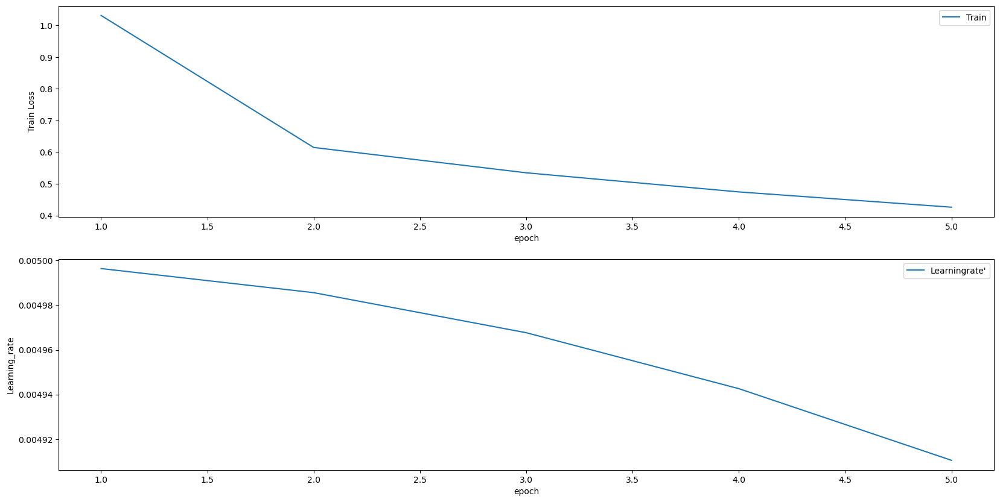

In [42]:
# ====================
# Show Learning Curve
# ====================
learning_curve = pd.DataFrame(
     data={
          'epoch': np.arange(1, cfg.epochs+1, 1), 
          'Train Loss': history['Train Loss'], 
          'Learning_rate': history['Learning rate'], 
          },
     )

fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(2, 1, 1) 
ax1 = sns.lineplot(x='epoch', y = 'Train Loss', data = learning_curve, label= "Train")
ax1 = fig.add_subplot(2, 1, 2) 
ax1 = sns.lineplot(x='epoch', y = 'Learning_rate', data = learning_curve, label= "Learningrate'")

In [43]:
ls

20230325_last_model.pt  Faster-RCNN.txt  football-players-detection-4/


## Inference

In [44]:
!cp /kaggle/tmp/* /kaggle/working

cp: -r not specified; omitting directory '/kaggle/tmp/football-players-detection-4'


In [45]:
# =====================
# Import Model
# =====================
data_class = cfg.dataset_class
data_class.insert(0, "__background__")
classes = tuple(data_class)

model_inf = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = len(cfg.dataset_class)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model_inf.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

PATH = f"/kaggle/working/{today}_last_model.pt"
model_inf.load_state_dict(torch.load(PATH))
model_inf.to(device)
model_inf.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [46]:
cfg.test_path

'/kaggle/input/dfl-annotation-dataset-for-mandetection/Test'

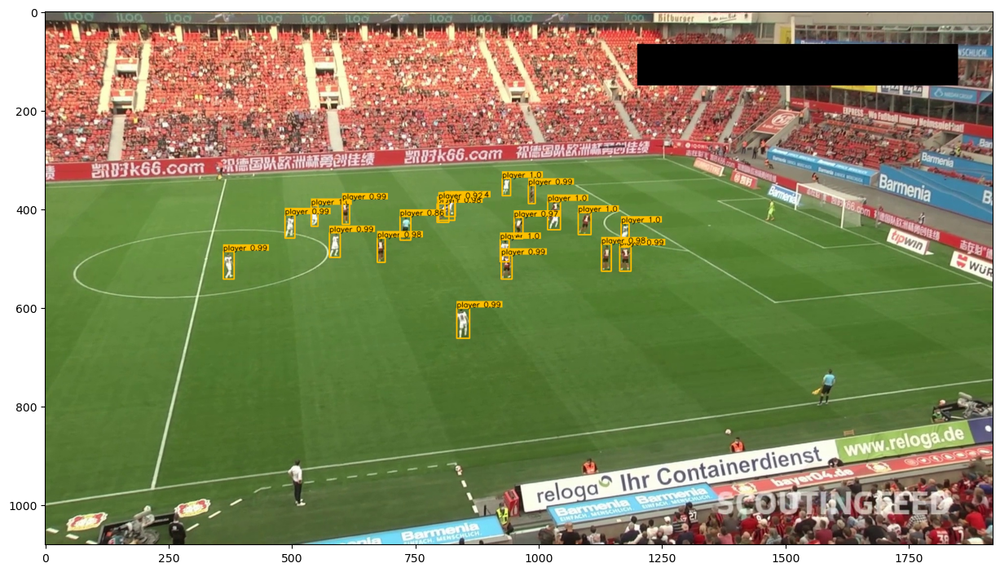

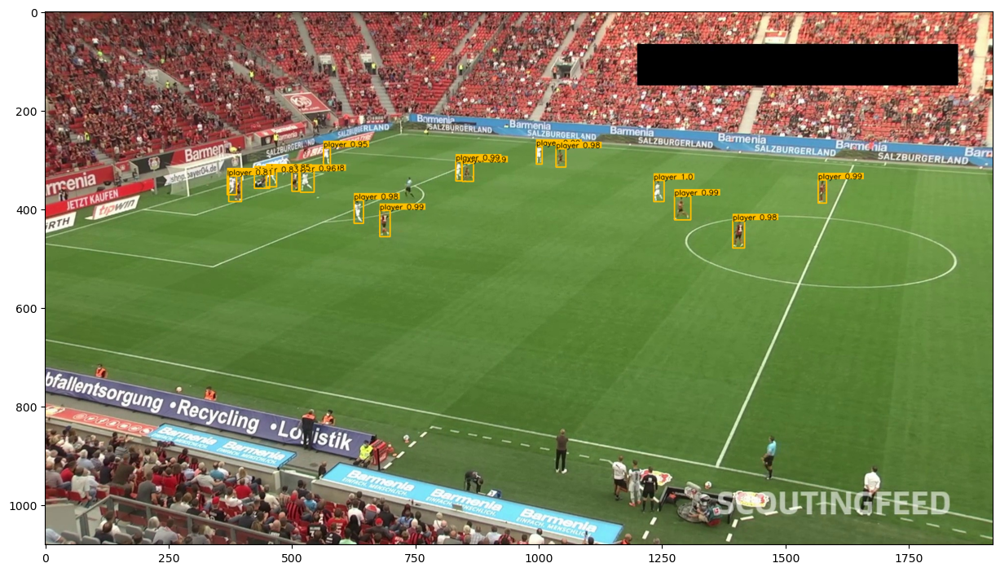

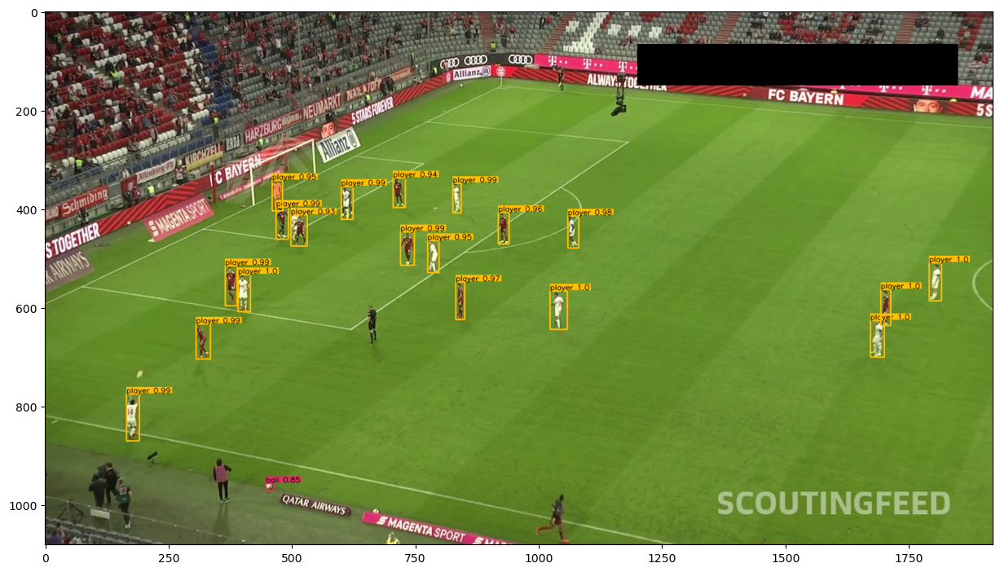

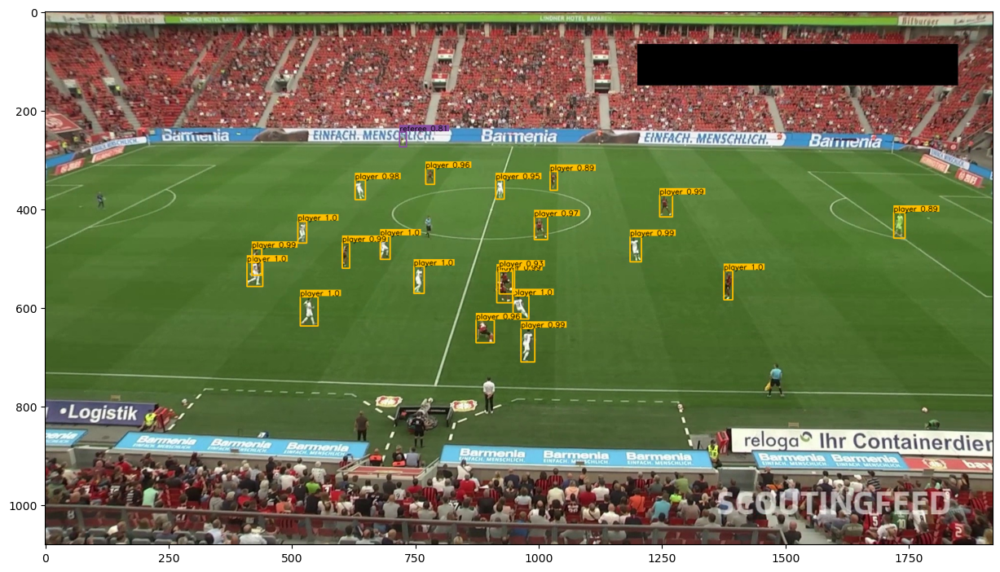

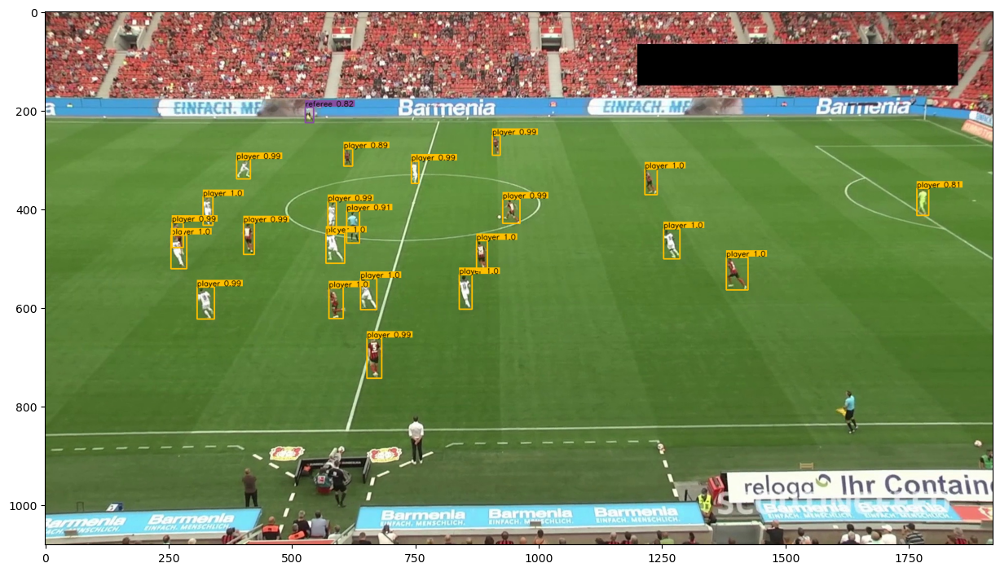

...

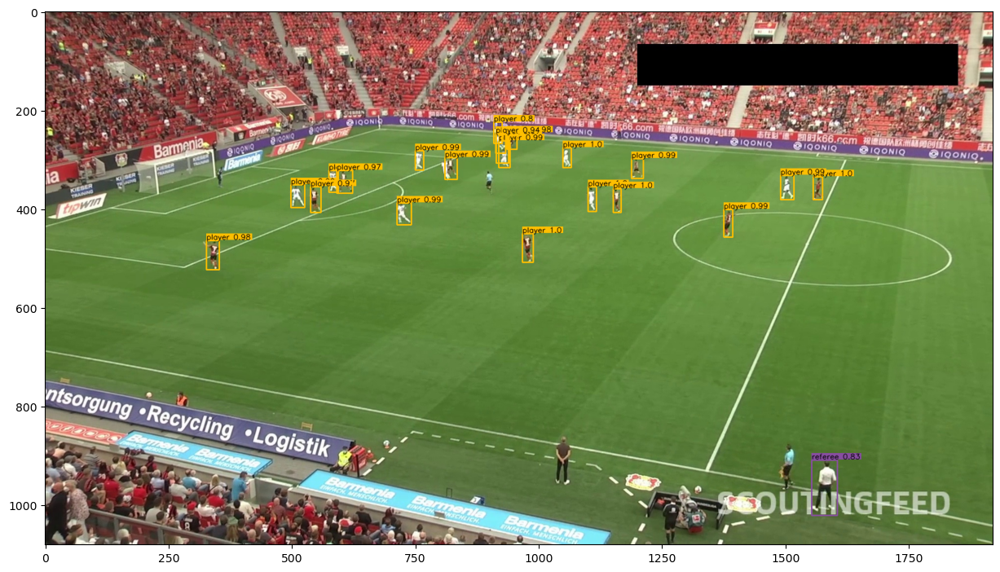

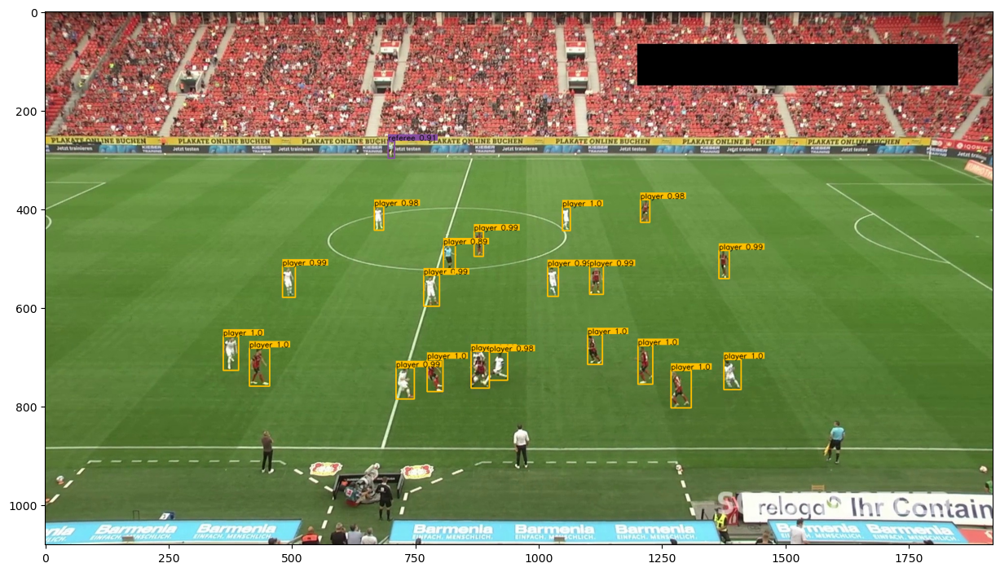

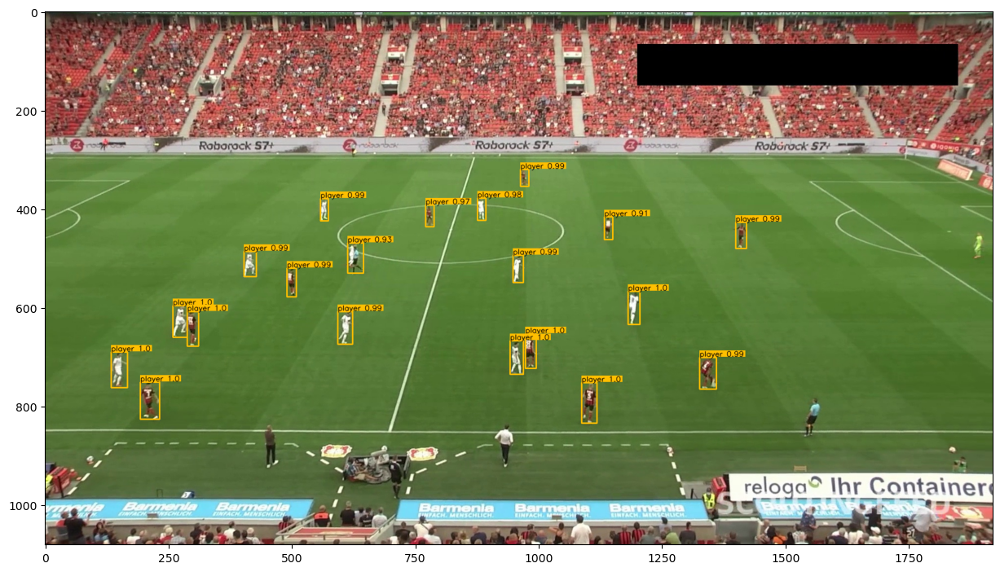

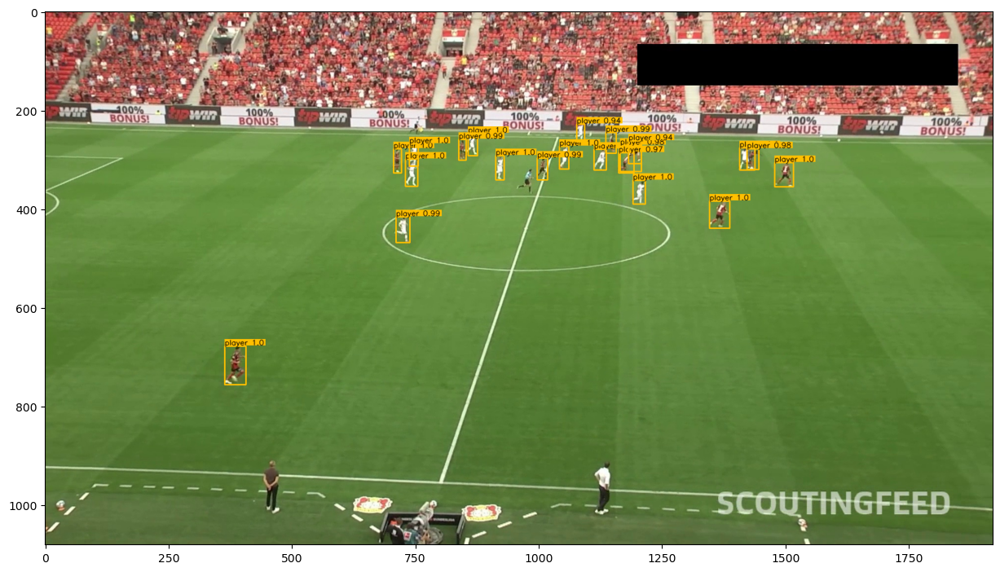

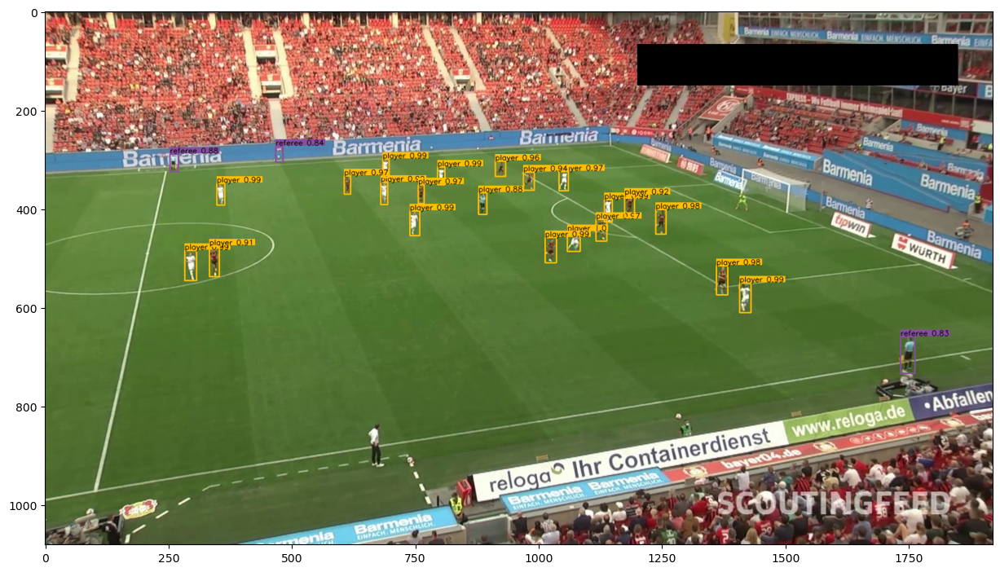

In [47]:
# ================================
# Inference and Vizualize image
# ================================
import glob
model_inf.to(device)
model_inf.eval()
for imgfile in sorted(glob.glob(cfg.test_path+'/*')):
    
    img = cv2.imread(imgfile)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image_tensor = torchvision.transforms.functional.to_tensor(img)

    with torch.no_grad():
        prediction = model_inf([image_tensor.to(device)])
    
    for i,box in enumerate(prediction[0]['boxes']):
        score = prediction[0]['scores'][i].cpu().numpy()
        if score > cfg.threshold:
            score = round(float(score),2)
            cat = prediction[0]['labels'][i].cpu().numpy()
            txt = '{} {}'.format(classes[int(cat)], str(score))
            font = cv2.FONT_HERSHEY_SIMPLEX
            cat_size = cv2.getTextSize(txt, font, 0.5, 2)[0]
#             print(cat)
            c = cfg.colors[int(cat)]
            box=box.cpu().numpy().astype('int')
            cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), c , 2)
            cv2.rectangle(img,(box[0], box[1] - cat_size[1] - 2),(box[0] + cat_size[0], box[1] - 2), c, -1)
            cv2.putText(img, txt, (box[0], box[1] - 2), font, 0.5, (0, 0, 0), thickness=1, lineType=cv2.LINE_AA)


    plt.figure(figsize=(15,10))
    plt.imshow(img)
plt.show()

In [48]:
ls /kaggle/working

20230325_last_model.pt  Faster-RCNN.txt  __notebook_source__.ipynb
